# Project 1: Planet Earth's Global Temperature - With Solutions


In this project, we will download temperature data from NASA’s Goddard Institute for Space Studies (GISS) and analyze it using pandas and seaborn.

### Introduction

First, we must understand the data collection method. This method was original documented by Hansen and Lebedeff in [1987](https://pubs.giss.nasa.gov/docs/1987/1987_Hansen_ha00700d.pdf) and the study has been repeated many times, including in [2010](https://pubs.giss.nasa.gov/docs/2010/2010_Hansen_ha00510u.pdf). A summary of the data collection method is as follows:
1. Thousands of meteorological stations around the world (land and sea) measure the surface air temperature. All measurements discussed here will be in Celsius.
1. The world average temperature throughout each month for all stations is calculated. Systematic affects are corrected and uncertainty is estimated.
1. The "**reference monthly average temperature**" is calculated by averaging over all stations and measurements during each month of the three decade period 1951-1980.
1. The "**temperature anomaly**" is defined as the world monthly average temperature minus the reference monthly average temperature.

### Accessing temperature anomaly data

The GISS temperatuire anomaly data can be found here: https://data.giss.nasa.gov/gistemp/

From this link please find and download the CSV file
"Global-mean monthly, seasonal, and annual means, 1880-present, updated through most recent month". The file name should be GLB.Ts+dSST.csv.

### Data analysis

#### Setup the notebook

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#  sometimes necessary for plotting with Jupyter+pandas+pyplot
%matplotlib inline

from matplotlib import pyplot
pyplot.rcParams['figure.dpi'] = 600

NB: The following will cause a (harmless) error if running locally:

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

#### Read in the data

Use panda's `read_csv()` function with the argument `skiprows=1` to read in the data and setup a dataframe.

In [3]:
# Data from https://data.giss.nasa.gov/gistemp/
df = pd.read_csv("https://data.giss.nasa.gov/gistemp/tabledata_v4/GLB.Ts+dSST.csv",skiprows=1)

#### Inspect the data

Inspect the dataframe you created using the `head()` and `tail()` functions.  You should see a "Year" column and a column for each month ("Jan", "Feb", etc.).  There are also columns for select averages:
* "J-D" = 1 year average temperature (January -> December)
* "D-N" = 1 year average temperature (December -> November)
* "DJF" = 3 month average temperature (Dec, Jan, Feb)
* "MAM" = 3 month average temperature (Mar, Apr, May)
* "JJA" = 3 month average temperature (Jun, Jul, Aug)
* "SON" = 3 month average temperature (Sep, Oct, Nov)       

In [4]:
df.head()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.19,-0.24,-0.09,-0.16,-0.10,-0.21,-0.18,-0.10,-0.14,-0.23,-0.21,-0.18,-0.17,***,***,-0.12,-0.16,-0.19
1,1881,-0.20,-0.14,0.03,0.05,0.06,-0.19,0.00,-0.04,-0.15,-0.22,-0.19,-0.07,-0.09,-.10,-.17,0.05,-0.08,-0.19
2,1882,0.16,0.14,0.05,-0.17,-0.14,-0.23,-0.16,-0.07,-0.14,-0.23,-0.16,-0.35,-0.11,-.09,.08,-0.09,-0.15,-0.18
3,1883,-0.29,-0.37,-0.12,-0.18,-0.17,-0.08,-0.06,-0.14,-0.21,-0.11,-0.23,-0.11,-0.17,-.19,-.34,-0.16,-0.09,-0.18
4,1884,-0.13,-0.07,-0.36,-0.40,-0.34,-0.36,-0.30,-0.27,-0.27,-0.25,-0.33,-0.30,-0.28,-.27,-.10,-0.37,-0.31,-0.28


In [5]:
df.tail()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
139,2019,0.93,0.95,1.17,1.01,0.85,0.90,0.94,0.95,0.92,1.00,0.99,1.09,0.98,.96,.93,1.01,0.93,0.97
140,2020,1.17,1.24,1.17,1.13,1.01,0.92,0.90,0.87,0.98,0.88,1.10,0.80,1.01,1.04,1.17,1.10,0.89,0.99
141,2021,0.81,0.64,0.89,0.75,0.78,0.84,0.92,0.82,0.92,1.00,0.94,0.86,0.85,.84,.75,0.81,0.86,0.95
142,2022,0.91,0.89,1.05,0.84,0.84,0.92,0.94,0.95,0.89,0.96,0.72,0.80,0.89,.90,.89,0.91,0.94,0.86
143,2023,0.87,0.98,1.20,1.00,0.94,1.08,1.19,1.19,1.48,1.34,1.43,1.37,1.17,1.12,.88,1.05,1.15,1.41


#### Data preparation 

Set the "Year" column as the dataframe index and verify the effect with the `tail()` function:

In [6]:
df = df.set_index("Year")
df.tail()

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
Year,,,,,,,,,,,,,,,,,,
2019,0.93,0.95,1.17,1.01,0.85,0.90,0.94,0.95,0.92,1.00,0.99,1.09,0.98,.96,.93,1.01,0.93,0.97
2020,1.17,1.24,1.17,1.13,1.01,0.92,0.90,0.87,0.98,0.88,1.10,0.80,1.01,1.04,1.17,1.10,0.89,0.99
2021,0.81,0.64,0.89,0.75,0.78,0.84,0.92,0.82,0.92,1.00,0.94,0.86,0.85,.84,.75,0.81,0.86,0.95
2022,0.91,0.89,1.05,0.84,0.84,0.92,0.94,0.95,0.89,0.96,0.72,0.80,0.89,.90,.89,0.91,0.94,0.86
2023,0.87,0.98,1.20,1.00,0.94,1.08,1.19,1.19,1.48,1.34,1.43,1.37,1.17,1.12,.88,1.05,1.15,1.41


Drop the last six columns ('J-D','D-N','DJF','MAM','JJA', and 'SON', which we will not use, and verify the effect with the `tail()` function:

In [7]:
df = df.drop(['J-D','D-N','DJF','MAM','JJA','SON'], axis=1)
df.tail()

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
Year,,,,,,,,,,,,
2019,0.93,0.95,1.17,1.01,0.85,0.90,0.94,0.95,0.92,1.00,0.99,1.09
2020,1.17,1.24,1.17,1.13,1.01,0.92,0.90,0.87,0.98,0.88,1.10,0.80
2021,0.81,0.64,0.89,0.75,0.78,0.84,0.92,0.82,0.92,1.00,0.94,0.86
2022,0.91,0.89,1.05,0.84,0.84,0.92,0.94,0.95,0.89,0.96,0.72,0.80
2023,0.87,0.98,1.20,1.00,0.94,1.08,1.19,1.19,1.48,1.34,1.43,1.37


#### Data cleaning

The data is updated regularly, but some months may not be available yet.  In such cases, the missing data appears as three asterisks (`***`). Replace such entries with something that pandas understands, `NaN` = Not a Number.

In [8]:
df = df.replace("***", "NaN")

#### Data visualization

Make a plot of the January Temperature Anomaly (column "Jan") versus year. Basically you are plotting the data contained in one column of the dataframe versus the index of the dataframe (the year). Please label your axes and include temperature units. Note, you can make bigger plots and label the axes using the following syntax (example from a previous notebook):

```python
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
ax.set_ylabel("foo")
ax.set_xlabel("bar")
```

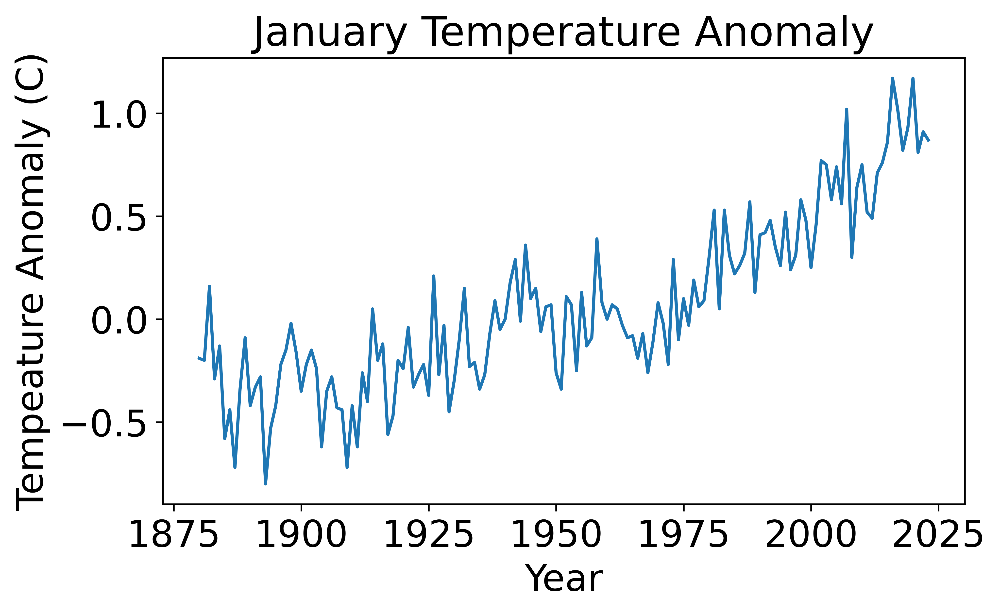

In [9]:
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
df["Jan"].plot(ax=ax)
ax.set_title('January Temperature Anomaly', fontsize=20)
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

Make the plot again, but with argument `kind='bar'`.

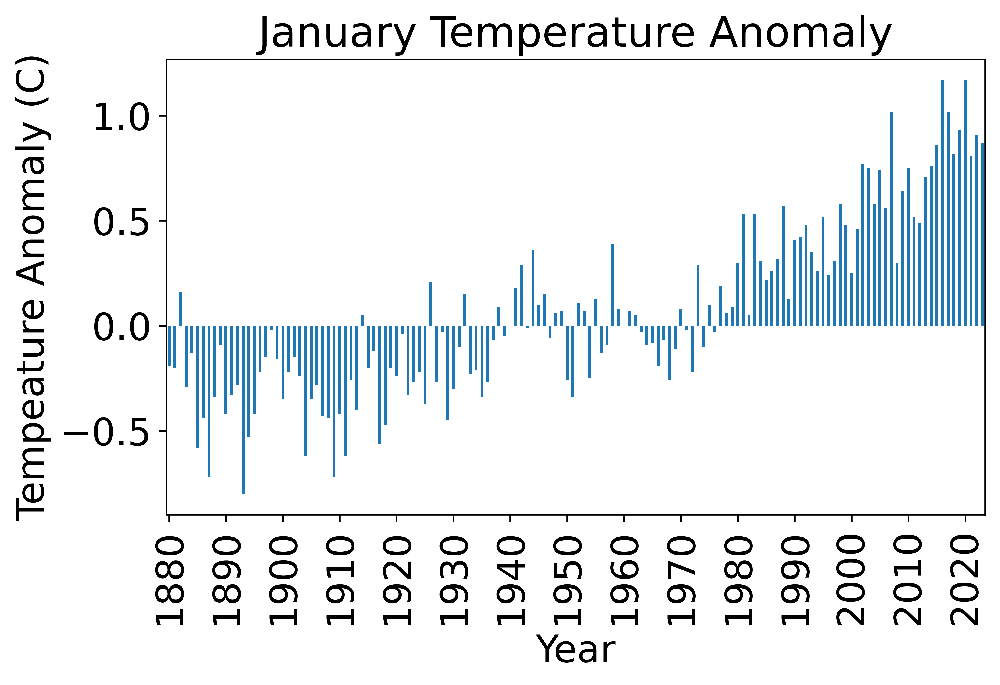

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
df["Jan"].plot(ax=ax, kind="bar")
ax.set_title('January Temperature Anomaly', fontsize=20)
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
ax.xaxis.set_major_locator(MultipleLocator(10))
ax.tick_params(axis='both', which='major', labelsize=18)

Make a new column in your new dataframe containing the average temperature anomaly for the year (with column name "Yearly Avg") and plot this column versus year. Calculate this average on your own (instead of relying on the "J-D" column which we dropped above). This can be done with the pandas [`mean()` function](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.mean.html). Check the documentation for this function to ensure that you are calculating the average over a row, not a column.  Finally,  verify the effect with the `tail()` function.

In [11]:
df["Yearly Avg"]=df.mean(axis=1)
df.tail()

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Yearly Avg
Year,,,,,,,,,,,,,
2019,0.93,0.95,1.17,1.01,0.85,0.90,0.94,0.95,0.92,1.00,0.99,1.09,0.975000
2020,1.17,1.24,1.17,1.13,1.01,0.92,0.90,0.87,0.98,0.88,1.10,0.80,1.014167
2021,0.81,0.64,0.89,0.75,0.78,0.84,0.92,0.82,0.92,1.00,0.94,0.86,0.847500
2022,0.91,0.89,1.05,0.84,0.84,0.92,0.94,0.95,0.89,0.96,0.72,0.80,0.892500
2023,0.87,0.98,1.20,1.00,0.94,1.08,1.19,1.19,1.48,1.34,1.43,1.37,1.172500


Make a plot of the yearly average temperature anomaly versus year (as a line graph again). 

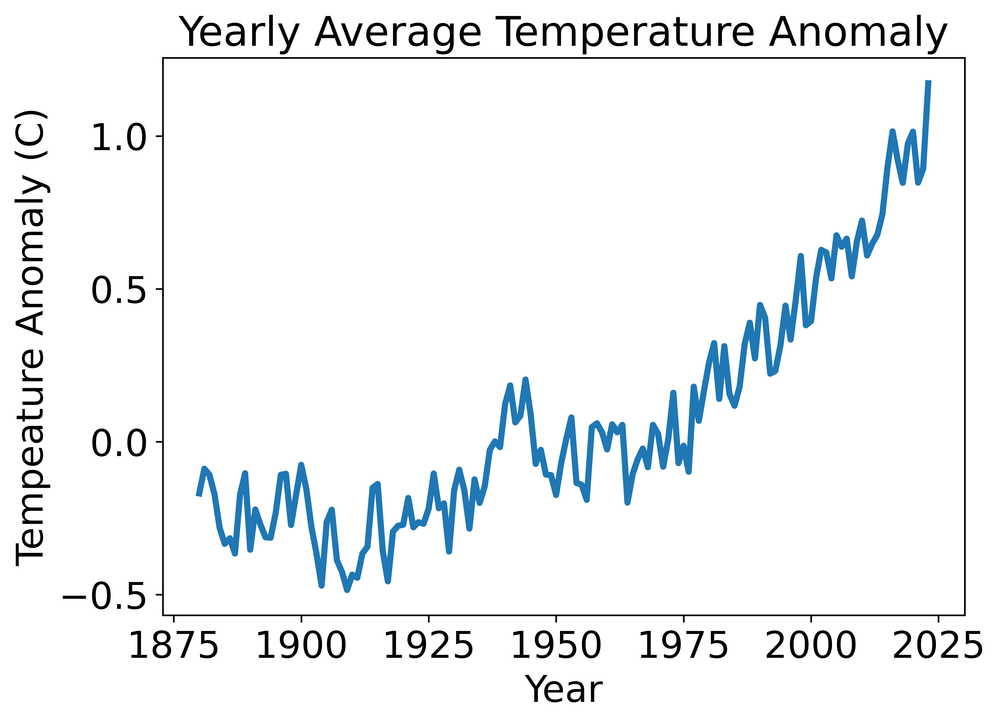

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(7, 5))
df["Yearly Avg"].plot(ax=ax,kind='line',linewidth=3)
ax.set_title('Yearly Average Temperature Anomaly', fontsize=20)
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

-----------------

Use a "Savitzky–Golay filterSavitzky–Golay filter" to smooth the data.  The scipy package includes a [`savgol_filter` function](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.savgol_filter.html) which implements this filter.  Try different values of the `window_length` (odd values only) and `polyorder` arguments to find suitable values.  Overlay the raw (in black) and smoothed (in blue) yearly averages.  Include a legend.

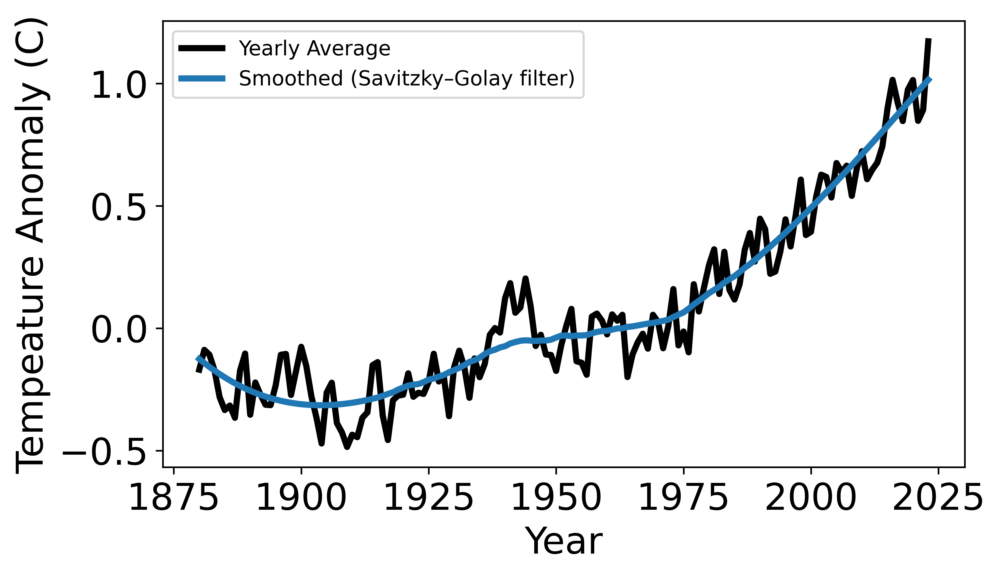

In [13]:
from scipy.signal import savgol_filter
y_smooth = savgol_filter(df["Yearly Avg"], 71, 3)
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
df["Yearly Avg"].plot(ax=ax,color='k',linewidth=3,label = "Yearly Average")
ax.plot(df.index.values,y_smooth,linewidth=3,label="Smoothed (Savitzky–Golay filter)")
plt.legend()
ax.set_ylabel("Temperature Anomaly (C)")
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

Slice the `dataframe` to obtain a new `dataframe` with only the last 10 years worth of data.  Average over these years to find the temperature anomaly for each of the 12 months, and print the result.

In [14]:
df10=df.iloc[-10:,]
df10.mean(axis=0)

Jan           0.932000
Feb           0.951000
Mar           1.062000
Apr           0.921000
May           0.876000
Jun           0.843000
Jul           0.869000
Aug           0.906000
Sep           0.938000
Oct           0.986000
Nov           0.952000
Dec           0.955000
Yearly Avg    0.932583
dtype: float64

------------

On a single set of axes, overlay the raw distribution (in black) with each of the 12 monthly average temperature anomalies (in various colors). Draw the yearly average with a thicker line width to make it stand out. Label your axes and draw a legend. 

It may help to draw the legend outside the axes using the following syntax:
```python
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., prop={'size': 11})
```

You can use matplotlib [`Colormaps`](https://matplotlib.org/stable/api/matplotlib_configuration_api.html#matplotlib.colormapshttps://matplotlib.org/stable/api/matplotlib_configuration_api.html#matplotlib.colormaps) to easily vary the color of each of the 12 monthly distributions.

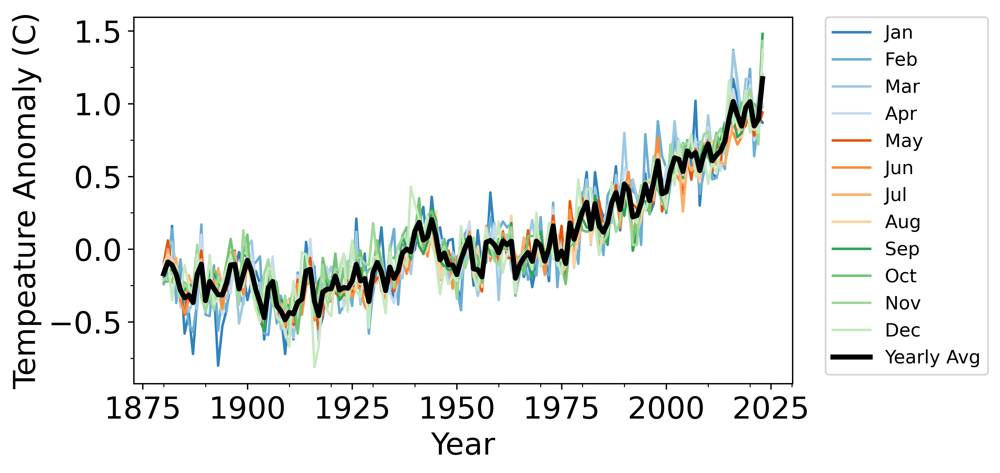

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(7, 4))

# Set Color cycle
#   https://matplotlib.org/stable/users/explain/colors/colormaps.html
#  plot_color_gradients('Qualitative',
#                     ['Pastel1', 'Pastel2', 'Paired', 'Accent', 'Dark2',
#                      'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b',
#                      'tab20c'])
from matplotlib.cm import get_cmap
name = "tab20c"
cmap = get_cmap(name)  # type: matplotlib.colors.ListedColormap
colors = cmap.colors   # type: list
ax.set_prop_cycle(color=colors)

# Plot all columns except the Yearly Average (since we want to plot
#  Yearly Average with a different line size and
#  we don't want it to appear in the legend twice)
df.loc[:, df.columns != 'Yearly Avg'].plot(ax=ax)

# Plot the yearly averge with large line width
df["Yearly Avg"].plot(ax=ax,color='k',linewidth=3)

# Plot beautification
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., prop={'size': 11})
ax.set_ylabel("Temperature Anomaly (C)")
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
ax.xaxis.set_minor_locator(MultipleLocator(10))
ax.yaxis.set_minor_locator(MultipleLocator(0.25))

Plot the temperature anomaly versus month. This time, do this for every every year (so there will be hundreds of lines drawn). 

Begin by using the `transpose()` function to convert the dataframe indices to columns and vice versa.

In [16]:
dft=df.transpose()
dft.tail()

Year,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Sep,-0.140000,-0.150000,-0.140000,-0.2100,-0.270000,-0.280000,-0.240000,-0.260000,-0.120000,-0.230000,...,0.870000,0.8500,0.900,0.770000,0.800000,0.920,0.980000,0.9200,0.8900,1.4800
Oct,-0.230000,-0.220000,-0.230000,-0.1100,-0.250000,-0.230000,-0.280000,-0.360000,0.010000,-0.250000,...,0.800000,1.0900,0.880,0.900000,1.010000,1.000,0.880000,1.0000,0.9600,1.3400
Nov,-0.210000,-0.190000,-0.160000,-0.2300,-0.330000,-0.240000,-0.280000,-0.260000,0.030000,-0.330000,...,0.660000,1.0600,0.920,0.880000,0.820000,0.990,1.100000,0.9400,0.7200,1.4300
Dec,-0.180000,-0.070000,-0.350000,-0.1100,-0.300000,-0.110000,-0.250000,-0.330000,-0.040000,-0.290000,...,0.770000,1.1600,0.860,0.930000,0.910000,1.090,0.800000,0.8600,0.8000,1.3700
Yearly Avg,-0.169167,-0.088333,-0.108333,-0.1725,-0.281667,-0.334167,-0.315833,-0.365833,-0.173333,-0.103333,...,0.743333,0.8975,1.015,0.921667,0.846667,0.975,1.014167,0.8475,0.8925,1.1725


Drop the "Yearly Average" row so that we only have monthly data in our plot.

In [17]:
dft=dft.drop(['Yearly Avg'],axis=0)
dft.tail()

Year,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Aug,-0.10,-0.04,-0.07,-0.14,-0.27,-0.31,-0.31,-0.36,-0.16,-0.20,...,0.83,0.79,1.02,0.87,0.77,0.95,0.87,0.82,0.95,1.19
Sep,-0.14,-0.15,-0.14,-0.21,-0.27,-0.28,-0.24,-0.26,-0.12,-0.23,...,0.87,0.85,0.90,0.77,0.80,0.92,0.98,0.92,0.89,1.48
Oct,-0.23,-0.22,-0.23,-0.11,-0.25,-0.23,-0.28,-0.36,0.01,-0.25,...,0.80,1.09,0.88,0.90,1.01,1.00,0.88,1.00,0.96,1.34
Nov,-0.21,-0.19,-0.16,-0.23,-0.33,-0.24,-0.28,-0.26,0.03,-0.33,...,0.66,1.06,0.92,0.88,0.82,0.99,1.10,0.94,0.72,1.43
Dec,-0.18,-0.07,-0.35,-0.11,-0.30,-0.11,-0.25,-0.33,-0.04,-0.29,...,0.77,1.16,0.86,0.93,0.91,1.09,0.80,0.86,0.80,1.37


Finally, plot all the distributions on a single set of axes.  Use magenta for the most recent year, and use the "brg" `Colormap` for all others (by passing the argument `cmap="brg"` to the `plot()` function). This will ensure that one can tell the old years from the more recent years.

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

dft.plot(ax=ax,cmap="brg")
dft.loc[:, dft.columns != 2023].plot(ax=ax,cmap="brg")
dft[2023].plot(ax=ax,color="magenta",linewidth=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=5, frameon=False, fontsize=10)
ax.set_ylabel("Temperature Anomaly (C)",fontsize=18)
ax.set_xlabel("Month",fontsize=18)

ax.set_title('Temperature Anomaly for Each Month', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=18)

It can be difficult to interpret such a busy plot.  You should make a simpler plot which can be more easily interpretted.

First, create a new `dataframe` with columns for each decade and rows for each month, which holds the average temperature anomly.

In [19]:
dfd = pd.DataFrame()

for year in range (1880,2023,10):

  index = int(year-1880)

  if year!=2020:
    name = str(year)+"-"+str(year+9)+" average"
    dfd[name]=dft.iloc[:,index:index+10].mean(axis=1)
  else:
    name = str(year)+"-"+str(year+3)+" average"
    dfd[name]=dft.iloc[:,index:index+3].mean(axis=1)
    
dfd

,1880-1889 average,1890-1899 average,1900-1909 average,1910-1919 average,1920-1929 average,1930-1939 average,1940-1949 average,1950-1959 average,1960-1969 average,1970-1979 average,1980-1989 average,1990-1999 average,2000-2009 average,2010-2019 average,2020-2023 average
Jan,-0.282,-0.333,-0.380,-0.320,-0.201,-0.133,0.114,-0.029,-0.071,0.044,0.322,0.405,0.607,0.803,0.963333
Feb,-0.229,-0.328,-0.305,-0.307,-0.269,-0.118,0.049,-0.067,-0.019,0.019,0.303,0.491,0.603,0.818,0.923333
Mar,-0.190,-0.303,-0.268,-0.362,-0.202,-0.158,0.034,-0.072,-0.035,0.067,0.301,0.455,0.660,0.913,1.036667
Apr,-0.201,-0.266,-0.307,-0.315,-0.283,-0.183,0.080,-0.060,-0.062,0.070,0.240,0.410,0.585,0.825,0.906667
May,-0.192,-0.240,-0.339,-0.339,-0.287,-0.163,0.049,-0.053,-0.039,0.049,0.266,0.348,0.550,0.786,0.876667
Jun,-0.238,-0.227,-0.322,-0.368,-0.315,-0.186,-0.015,-0.040,-0.010,0.025,0.196,0.423,0.541,0.730,0.893333
Jul,-0.165,-0.174,-0.302,-0.311,-0.259,-0.126,0.024,-0.033,-0.019,0.020,0.228,0.376,0.551,0.725,0.920000
Aug,-0.196,-0.199,-0.306,-0.321,-0.267,-0.123,0.008,-0.033,-0.014,0.013,0.242,0.343,0.560,0.801,0.880000
Sep,-0.204,-0.169,-0.314,-0.307,-0.231,-0.103,0.019,-0.036,-0.031,0.034,0.230,0.298,0.593,0.779,0.930000
Oct,-0.215,-0.155,-0.285,-0.287,-0.170,-0.034,0.102,-0.036,-0.005,0.009,0.196,0.352,0.599,0.854,0.946667


On a single set of axes, plot the temperature anomaly versus month for each decade.

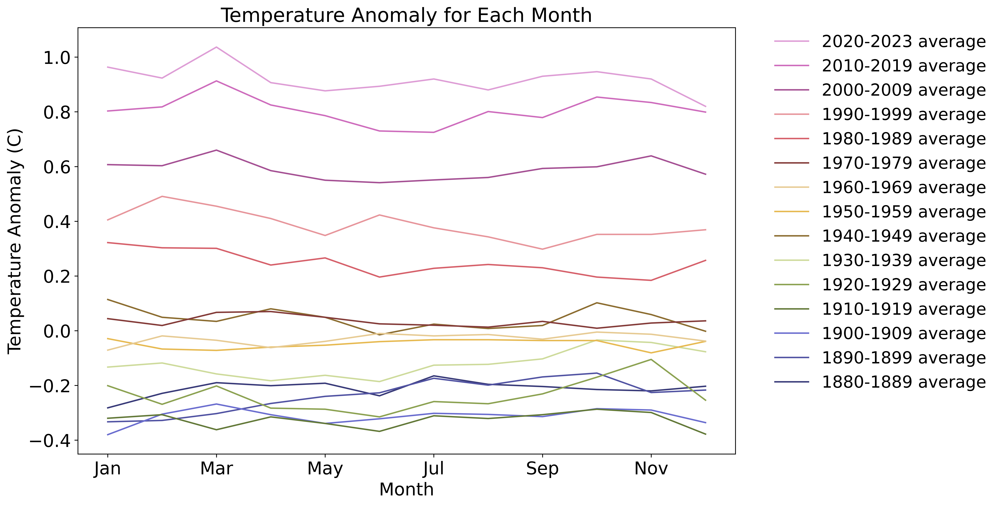

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

dfd.plot(ax=ax,cmap="tab20b")

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1],bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1, frameon=False, fontsize=17)
ax.set_ylabel("Temperature Anomaly (C)",fontsize=18)
ax.set_xlabel("Month",fontsize=18)

ax.set_title('Temperature Anomaly for Each Month', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=18)

---------------

Use seaborn to plot the dataframe as a heatmap. The $y$-axis should be the month and the $x$-axis should be the year. The $z$-axis (the color of the heatmap) should represent the temperature anomaly. Choose a color palette that you think will be a good way of representating the data https://matplotlib.org/examples/color/colormaps_reference.html.

In [21]:
import seaborn as sns
sns.set_style("ticks")
sns.set_context("paper")

fig, ax = plt.subplots(1, 1, figsize=(22, 10))
ax = sns.heatmap(dft,cmap="inferno")
ax.set_ylabel("Month",fontsize=22)
ax.set_xlabel("Year",fontsize=22)
ax.set_title('Average Temperature Anomaly (C) for every month of every year since 1880', fontsize=24)
ax.tick_params(axis='x', which='major', labelsize=14)
ax.tick_params(axis='y', which='major', labelsize=16)

# Colorbar beautification
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)
cbar.set_label("Temperature Anomaly (C)",size=22)